### 傾いた画像を真っ直ぐに立て直す正立処理のステップ
次の画像を処理対象とする

In [5]:
src1="images/figa1.jpg"

使用するパッケージ

In [35]:
import os, sys
import cv2
import numpy as np

opencvに画像ファイルを読み込む関数

In [36]:
def read(path) :
    img = cv2.imread(path)
    return img

opencvの画像データをjupyterにインライン表示する関数

In [37]:
from IPython.display import display, Image

def disp(image, format='.png'):
    decoded_bytes = cv2.imencode(format, image)[1].tobytes()
    display(Image(data=decoded_bytes))

処理対象の画像を読み込む

In [38]:
fig1 = read(src1)

画像1を表示

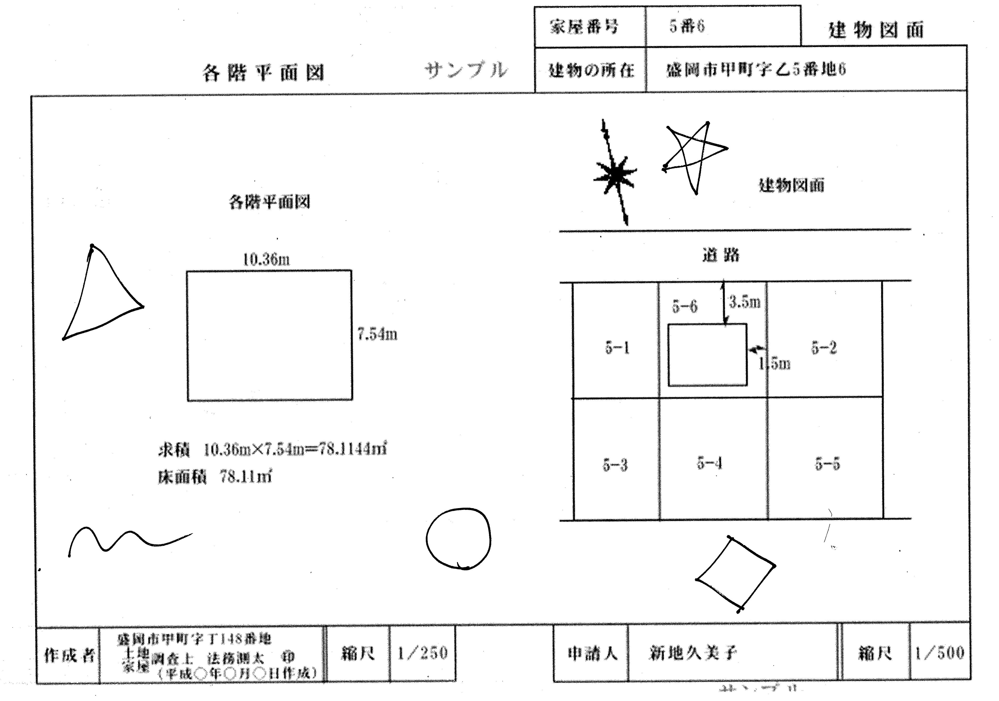

In [39]:
disp(fig1)

かんたんな平滑化

In [40]:
def blur(src, block=3) :
    dst = cv2.GaussianBlur(src, (block, block), 0)
    return dst

In [41]:
blur1 = blur(fig1)

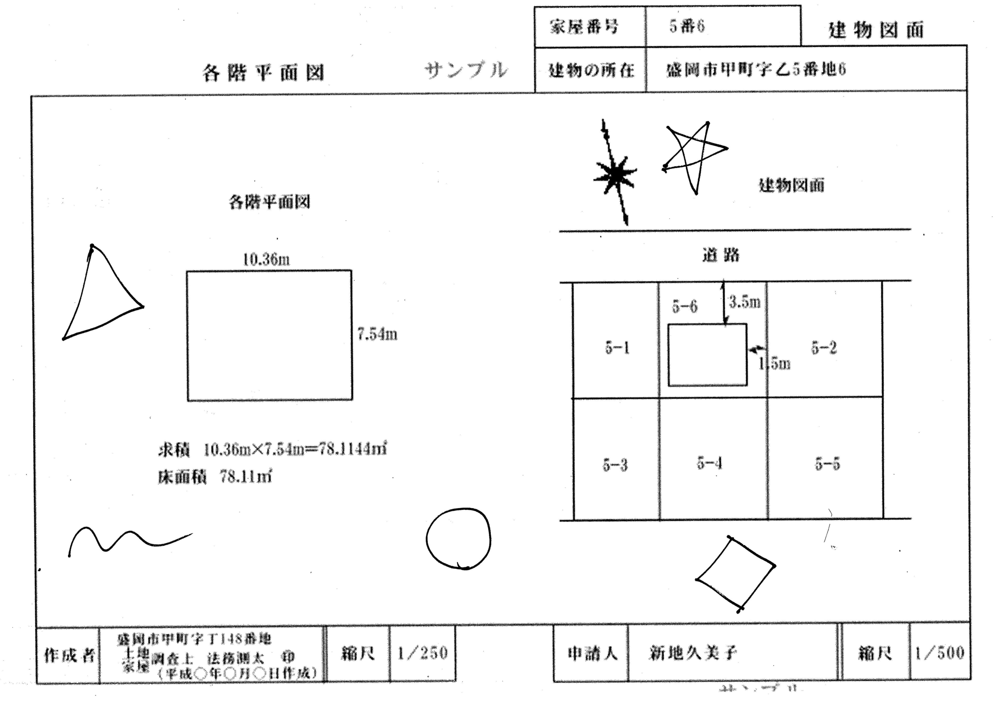

In [61]:
disp(blur1)

グレー画像に変換

In [42]:
def gray(src) :
    dst = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
    return dst

In [43]:
gray1 = gray(blur1)

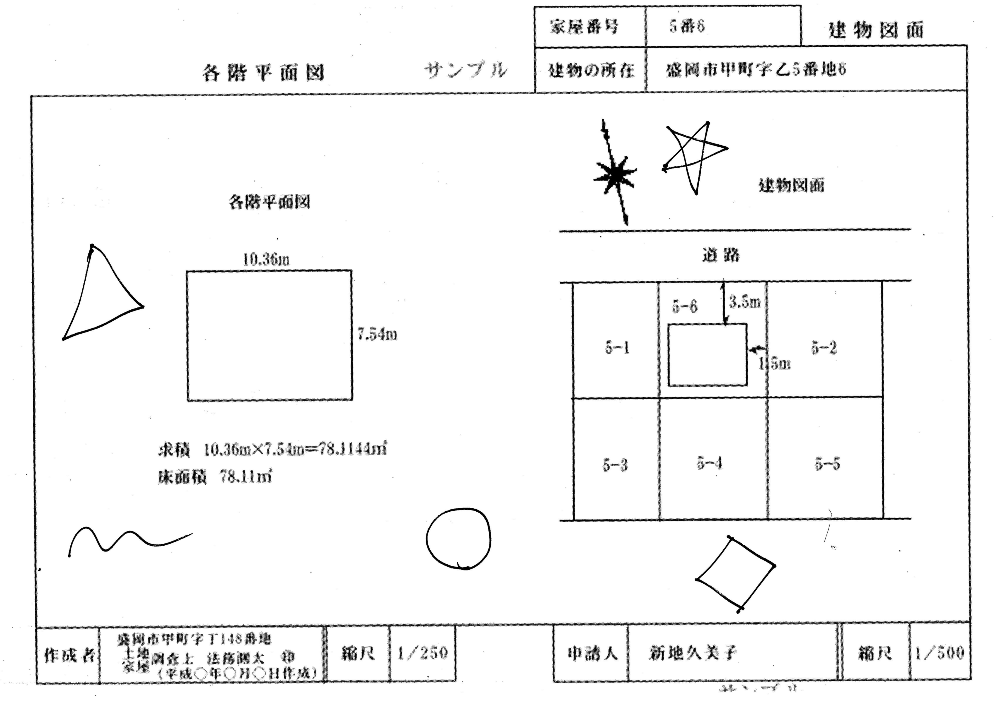

In [62]:
disp(gray1)

中間調で二値化して、白黒反転

In [44]:
def bininv(src, thr=128) :
    dst = cv2.threshold(src, thr, 255, cv2.THRESH_BINARY_INV)
    return dst

In [64]:
inv1 = bininv(gray1)[1]

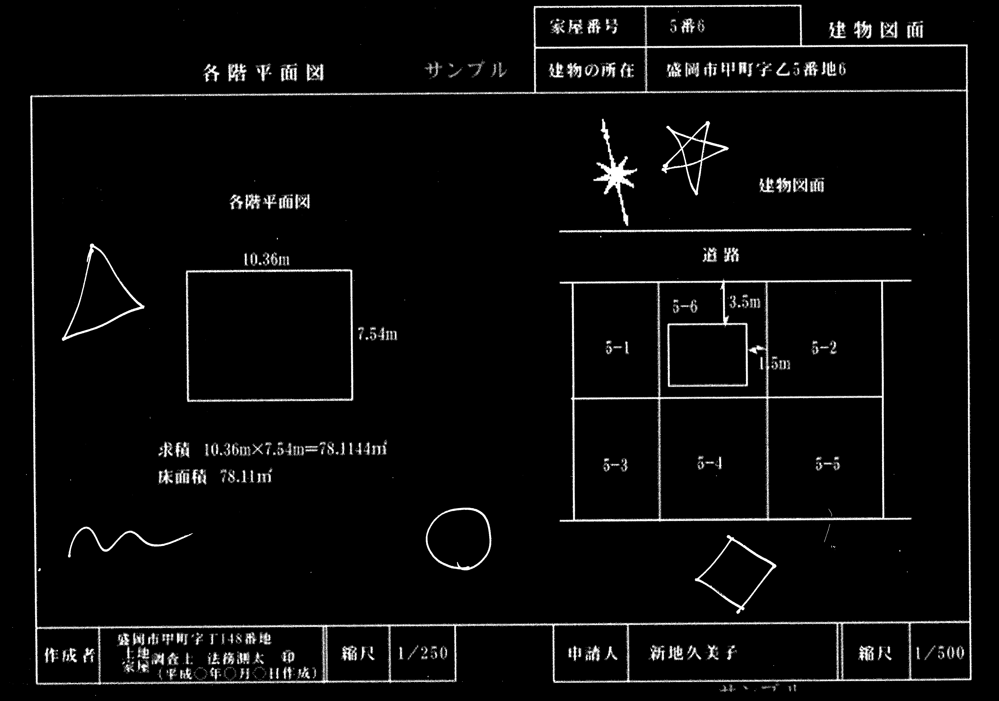

In [65]:
disp(inv1)

#### 正立処理を構成する処理

画像の各列(axis=0)、または、各行(axis=1)の合計値を求めて、その合計値の分散を求める関数

In [46]:
def sumsvar(img, axis=0) :
    sums = img.sum(axis)
    return sums.var()

画像をdeg[度]回転する関数

In [47]:
def rotate(src, deg) :
    h = src.shape[0]
    w = src.shape[1]
    size = (w, h)
    center = (w/2, h/2)
    scale = 1.0
    matrix = cv2.getRotationMatrix2D(center, deg, scale)
    rotated = cv2.warpAffine(src, matrix, size, flags=cv2.INTER_CUBIC) 
    return rotated

画像を0〜range[度]の範囲、step[度]刻みで回転させて分散が一番大きくなる角度と回転結果の画像を求める関数

In [66]:
def maxvardeg(src, range, step, axis=1) :
    vmax = sumsvar(src, axis)
    deg = 0
    while abs(deg) <= abs(range) :
        tst = deg + step
        dst = rotate(src, tst)
        v = sumsvar(dst, axis)
        if v < vmax :
            break
        vmax = v
        deg = tst
    return deg, dst

#### 正立処理

In [67]:
def upright(src, range=5, step=0.05) :
    vvar = sumsvar(src, axis=1)
    hvar = sumsvar(src, axis=0)
    axis = 1 if vvar > hvar else 0
    deg, dst=maxvardeg(src, range, step, axis)
    if deg == 0 :
        deg, dst=maxvardeg(src, -range, -step, axis)
    return deg, dst

In [69]:
deg, uprighted = upright(inv1)

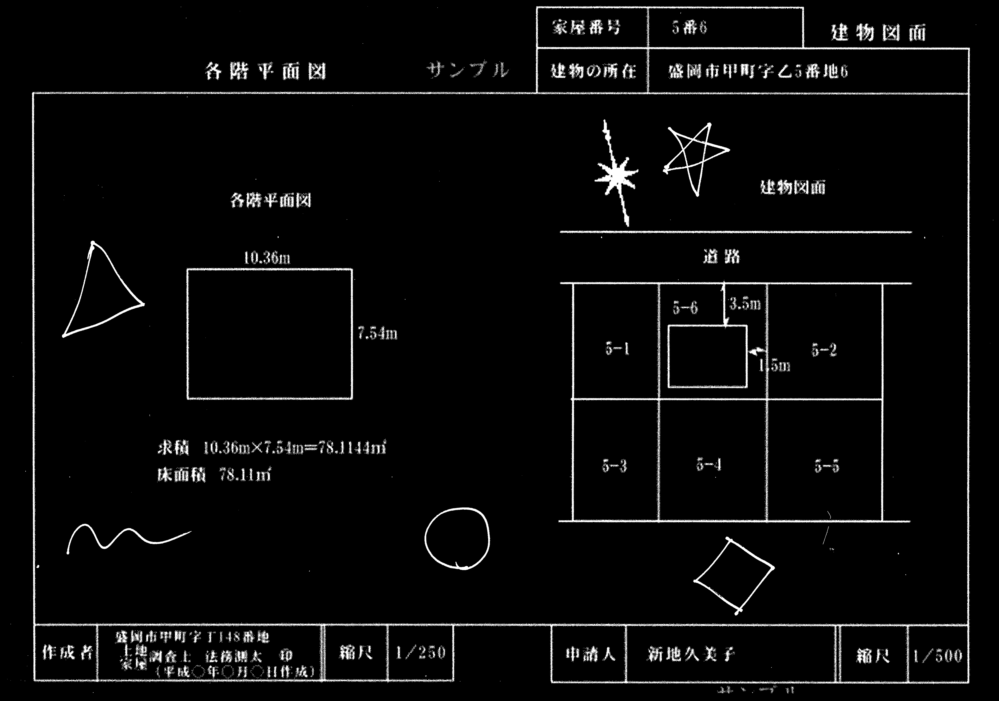

In [70]:
disp(uprighted)

白黒反転

In [73]:
def invert(src) :
    dst = cv2.bitwise_not(src)
    return dst

In [74]:
result=invert(uprighted)

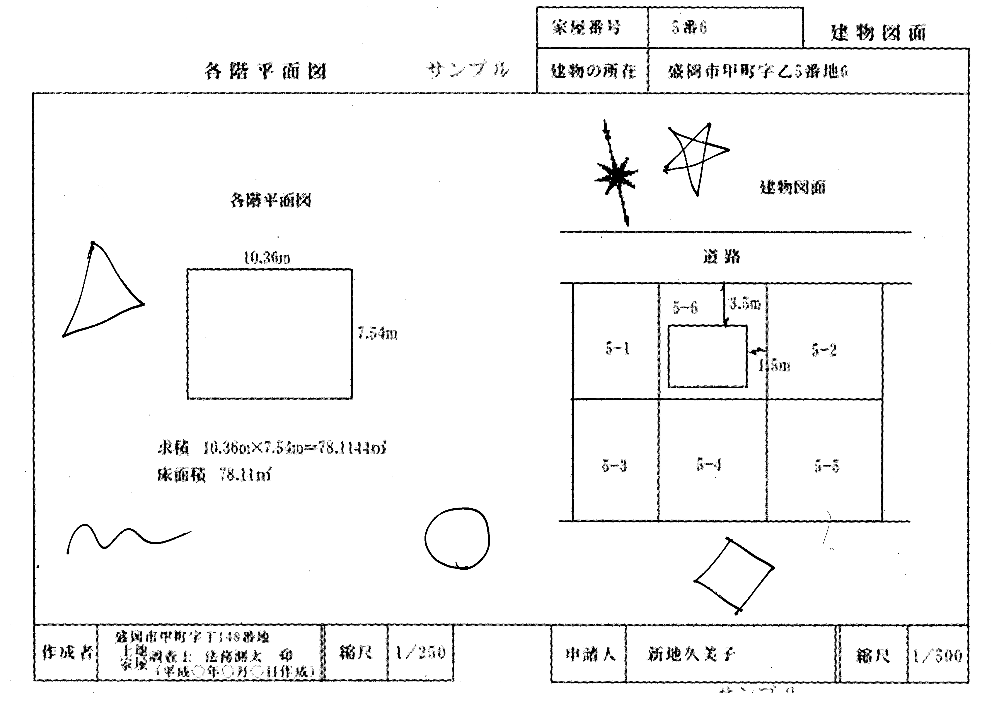

In [75]:
disp(result)